# 1. Business Understanding

# 2. Data Integration

## 2.1 Libraries Import

In [1]:
# Necessary installations

#!pip install seaborn
#!pip install matplotlib
#!pip install numpy
#!pip install pandas
#!pip install scikit-learn
#!pip install scipy


# Necessary imports

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA

from functions import *

from scipy.stats import skew

%matplotlib inline

# for better resolution plots
%config InlineBackend.figure_format = 'retina'

# setting the style of seaborn
sns.set(rc={'figure.figsize':(11.7,8.27)})

## 2.2 Data Load

In [2]:
# Importing the dataset
df = pd.read_csv('Case1_HotelCustomerSegmentation.csv', sep=';')
df.set_index('ID', inplace=True)

### 2.2.1 Metadata

ID: Customer ID

Nationality: Nationality of the customer in ISO 3166-1 (Alpha 3) format

Age: The age of the customer

DaysSinceCreation: Number of elapsed days since the customer was created

NameHash: Hash of the customer's name

DocIDHash: Hash of the customer’s personal document identification number (usually a passport or ID card)

AverageLeadTime: Average number of days before arrival date the customer makes bookings

LodgingRevenue: Total amount of lodging revenue paid by the customer so far

OtherRevenue: Total amount of other revenue (e.g., food & beverage, spa, etc.) paid by the customer so far

BookingsCanceled: Number of bookings the customer made but subsequently canceled

BookingsNoShowed: Number of bookings the customer made but subsequently made a "no-show"

BookingsCheckedin: Number of bookings the customer made, which actually ended up staying

PersonNights: Total person/nights the customer has stayed at the hotel so far. Persons/Nights are the sum of Adults and Children in
each booking, multiplied by the number of Nights (Length-of-stay) of the booking

RoomNights: Total of room/nights the customer has stayed at the hotel so far. Room/Nights are the multiplication of the number of
rooms of each booking by the the number of Nights (Length-of stay) of the booking

DistributionChannel: Distribution channel normally used by the customer to make bookings at the hotel

MarketSegment: Current market segment of the customer

SRHighFloor: Indication if the customer usually asks for a room in a higher floor (0: No, 1: Yes)

SRLowFloor: Indication if the customer usually asks for a room in a lower floor (0: No, 1: Yes)

SRAccessibleRoom: Indication if the customer usually asks for an accessible room (0: No, 1: Yes)

SRMediumFloor: Indication if the customer usually asks for a room in a middle floor (0: No, 1: Yes)

SRBathtub Indication if the customer usually asks for a room with a bathtub (0: No, 1: Yes)

SRShower: Indication if the customer usually asks for a room with a shower (0: No, 1: Yes)

SRCrib: Indication if the customer usually asks for a crib (0: No, 1: Yes)

SRKingSizeBed: Indication if the customer usually asks for a room with a king size bed (0: No, 1: Yes)

SRTwinBed Indication if the customer usually asks for a room with a twin bed (0: No, 1: Yes)

SRNearElevator: Indication if the customer usually asks for a room near the elevator (0: No, 1: Yes)

SRAwayFromElevator: Indication if the customer usually asks for a room away from the elevator (0: No, 1: Yes)

SRNoAlcoholInMiniBar: Indication if the customer usually asks for a room with no alcohol in the mini bar (0: No, 1: Yes)

SRQuietRoom: Indication if the customer usually asks for a room away from the noise (0: No, 1: Yes)

NOTE: All time-based columns (e.g., Age or DaysSinceCreation) were calculated at the dataset extraction date.

### 2.2.2 Data Overview

In [26]:
# Show all the columns when doing head()
pd.set_option('display.max_columns', None)
df.head()

,Nationality,Age,DaysSinceCreation,NameHash,DocIDHash,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,PRT,52.0,440,0x2C371FD6CE12936774A139FD7430C624F1C4D5109CE6...,0x434FD3D59469C73AFEA087017FAF8CA2296493AEABDE...,59,292.0,82.3,1,0,2,6,4,Corporate,Corporate,0,0,0,0,0,0,0,0,0,0,0,0,0
2,PRT,NaN,1385,0x198CDB98BF37B6E23F9548C56A88B00912D65A9AA0D6...,0xE3B0C44298FC1C149AFBF4C8996FB92427AE41E4649B...,61,280.0,53.0,0,0,1,10,5,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
3,DEU,32.0,1385,0xDA46E62F66936284DF2844EC4FC542D0DAD780C0EE0C...,0x27F5DF762CCDA622C752CCDA45794923BED9F1B66300...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
4,FRA,61.0,1385,0xC45D4CD22C58FDC5FD0F95315F6EFA5A6E7149187D49...,0x8E59572913BB9B1E6CAA12FA2C8B7BF387B1D1F3432E...,93,240.0,60.0,0,0,1,10,5,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
5,FRA,52.0,1385,0xD2E3D5BFCA141865669F98D64CDA85AD04DEFF47F8A0...,0x42BDEE0E05A9441C94147076EDDCC47E604DA5447DD4...,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0


In [245]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 111733 entries, 1 to 111733
Data columns (total 28 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Nationality           111733 non-null  object 
 1   Age                   107561 non-null  float64
 2   DaysSinceCreation     111733 non-null  int64  
 3   NameHash              111733 non-null  object 
 4   DocIDHash             110732 non-null  object 
 5   AverageLeadTime       111733 non-null  int64  
 6   LodgingRevenue        111733 non-null  float64
 7   OtherRevenue          111733 non-null  float64
 8   BookingsCanceled      111733 non-null  int64  
 9   BookingsNoShowed      111733 non-null  int64  
 10  BookingsCheckedIn     111733 non-null  int64  
 11  PersonsNights         111733 non-null  int64  
 12  RoomNights            111733 non-null  int64  
 13  DistributionChannel   111733 non-null  object 
 14  MarketSegment         111733 non-null  object 
 15  SRHig

### 2.2.3 Filtering out unnecessary columns

In [3]:
# Dropping unnecessary columns
df.drop(['NameHash', 'DocIDHash'], axis=1, inplace=True)

### 2.2.4. Data Types

In [247]:
pd.DataFrame(df.dtypes.rename('Datatype'))

,Datatype
Nationality,object
Age,float64
DaysSinceCreation,int64
AverageLeadTime,int64
LodgingRevenue,float64
OtherRevenue,float64
BookingsCanceled,int64
BookingsNoShowed,int64
BookingsCheckedIn,int64
PersonsNights,int64


# 3. Data Understanding

### 3.1 Separating numerical and categorical variables

| Numerical Variables | Categorical Variables (1) |  (2) |
| --- |---------------------------|---------------------------|
| Age | SRHighFloor               | SRAwayFromElevator        |
| AverageLeadTime | SRMediumFloor             | SRNearElevator            |
| BookingsCanceled | SRLowFloor                | SRNoAlcoholInMiniBar      |
| BookingsCheckedIn | SRCrib                    | MarketSegment             |
| BookingsNoShowed | SRTwinBed                 | DistributionChannel       |
| DaysSinceCreation | SRKingSizeBed             | Nationality               |
| LodgingRevenue | SRQuietRoom               |                           |
| OtherRevenue | SRAccessibleRoom          |                           |
| PersonsNights | SRShower                  |                           |
| RoomNights | SRBathtub                 |                           |

In [4]:
# identify numerical and categorical variables
categorical = df.columns[df.columns.str.contains('SR')].tolist() + ['DistributionChannel', 'MarketSegment', 'Nationality']
numerical = df.columns.difference(categorical).tolist()

### 3.2 Unique values

#### 3.2.1 Values in Numerical

In [8]:
for column in numerical:
    print(f'{column}:{df[column].unique()}')

Age:[ 52.  nan  32.  61.  55.  50.  33.  43.  26.  28.  59.  57.  58.  69.
  73.  72.  25.  27.  51.  53.  37.  65.  66.  48.  68.  40.  42.  44.
   4.  64.  31.  29.  19.  54.  49.  18.  39.  41.  60.  14.  62.  70.
  56.  71.  35.  67.  83.  36.   7.  63.  46.  38.  30.  11.   9.   8.
   5.  45.  10.  34.   6.  47.  21.  15.  75.  12.  74.   2.  23.  20.
  79.  78.  22.  77.  76.  16.  84.  13.  24.  81.  80.  17.  -6.  82.
 115.  85.  -8.  86.  88. -10.  90.  92.  89.  87.  -9.  -5.   0. 111.
   3.  93. 114.  91.   1. 123.  97. 110.  95.]
AverageLeadTime:[ 59  61   0  93  58  38  96  60  87  11 109  63   2  95   7  94   1  85
  78  13  67  65  80  98  97  57   6  72  70 103  49  86  41  69  89  99
  43  52  68  10  71  81  46  84  55  75  54  50  29  77  40  18  42  91
  28  27  44  23 101   3  56  83  39  66   4  31  45  12  24 102  33  32
  25  20   5  35 106  21  30  73   9  16  48  36  79  17  34  64  62   8
  47  15  53  14 105  88  22 129 137  92  51  19 132  26 128 139  76  7

These Features (BookingsCheckedIn, DistributionChannel and MarketSegment) Important to:
1. Understanding Customer Behavior:
    - Some segments frequently cancel or no-show (e.g., Travel Agent/Operator might have higher cancellations).
    - Some channels bring reliable, high-value customers (e.g., Corporate customers may have higher conversion rates).
2. Segmenting Booking Intentions vs. Actual Stays:
    - Helps separate real guests from non-staying bookers.
3. Identifying Booking Trends:
    - Certain channels might be more effective for long-term loyalty, while others may be transactional (e.g., group bookings for events).


#### 3.2.2 Values in Categorical

In [9]:
for column in categorical:
    print(f'{column}:{df[column].unique()}')

SRHighFloor:[0 1]
SRLowFloor:[0 1]
SRAccessibleRoom:[0 1]
SRMediumFloor:[0 1]
SRBathtub:[0 1]
SRShower:[0 1]
SRCrib:[0 1]
SRKingSizeBed:[0 1]
SRTwinBed:[0 1]
SRNearElevator:[0 1]
SRAwayFromElevator:[0 1]
SRNoAlcoholInMiniBar:[0 1]
SRQuietRoom:[0 1]
DistributionChannel:['Corporate' 'Travel Agent/Operator' 'Direct' 'GDS Systems']
MarketSegment:['Corporate' 'Travel Agent/Operator' 'Other' 'Direct' 'Complementary'
 'Groups' 'Aviation']
Nationality:['PRT' 'DEU' 'FRA' 'JPN' 'IRL' 'ESP' 'BEL' 'NLD' 'AUT' 'ITA' 'CHN' 'RUS'
 'POL' 'USA' 'HUN' 'CRI' 'MEX' 'CHE' 'ROU' 'GBR' 'BIH' 'BRA' 'FIN' 'AGO'
 'CAN' 'ZAF' 'TWN' 'GRC' 'AUS' 'ISR' 'BGR' 'SAU' 'SWE' 'ARG' 'ARM' 'CHL'
 'MAR' 'MOZ' 'KOR' 'TUN' 'DNK' 'NOR' 'MYS' 'EGY' 'IND' 'HRV' 'CPV' 'JOR'
 'COD' 'DZA' 'LUX' 'TUR' 'IRN' 'LBY' 'PAN' 'COL' 'VEN' 'GNB' 'CZE' 'AND'
 'SVN' 'PER' 'ATF' 'UGA' 'AZE' 'NZL' 'LTU' 'SRB' 'EST' 'KAZ' 'KWT' 'IDN'
 'UKR' 'SVK' 'MLI' 'ARE' 'BGD' 'THA' 'TZA' 'LVA' 'PHL' 'BHR' 'NAM' 'BOL'
 'CYP' 'SGP' 'CMR' 'MLT' 'URY' 'PAK' 'JAM

### 3.3 Descriptive Statistics

#### 3.3.1 Numerical Variables

In [10]:
df[numerical].describe()

,Age,AverageLeadTime,BookingsCanceled,BookingsCheckedIn,BookingsNoShowed,DaysSinceCreation,LodgingRevenue,OtherRevenue,PersonsNights,RoomNights
count,107561.000000,111733.000000,111733.000000,111733.000000,111733.000000,111733.000000,111733.000000,111733.000000,111733.000000,111733.000000
mean,45.639191,60.833147,0.002282,0.737607,0.000600,595.026599,283.851283,64.682802,4.328318,2.203825
std,17.244952,85.115320,0.080631,0.730889,0.028217,374.657382,379.131556,123.580715,4.630739,2.301637
min,-10.000000,-1.000000,0.000000,0.000000,0.000000,36.000000,0.000000,0.000000,0.000000,0.000000
25%,33.000000,0.000000,0.000000,0.000000,0.000000,288.000000,0.000000,0.000000,0.000000,0.000000
50%,47.000000,21.000000,0.000000,1.000000,0.000000,522.000000,208.000000,31.000000,4.000000,2.000000
75%,58.000000,95.000000,0.000000,1.000000,0.000000,889.000000,393.300000,84.000000,6.000000,3.000000
max,123.000000,588.000000,15.000000,76.000000,3.000000,1385.000000,21781.000000,8859.250000,116.000000,185.000000


#### 3.3.2 Categorical Variables

In [11]:
df[categorical].replace({0: 'No', 1: 'Yes'}).describe()

,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom,DistributionChannel,MarketSegment,Nationality
count,111733,111733,111733,111733,111733,111733,111733,111733,111733,111733,111733,111733,111733,111733,111733,111733
unique,2,2,2,2,2,2,2,2,2,2,2,2,2,4,7,199
top,No,No,No,No,No,No,No,No,No,No,No,No,No,Travel Agent/Operator,Other,FRA
freq,106983,111587,111708,111647,111383,111551,109925,71144,94212,111696,111331,111711,101932,91019,63680,16516


### 3.4 Univariate Analysis

#### 3.4.1 Numerical Variables

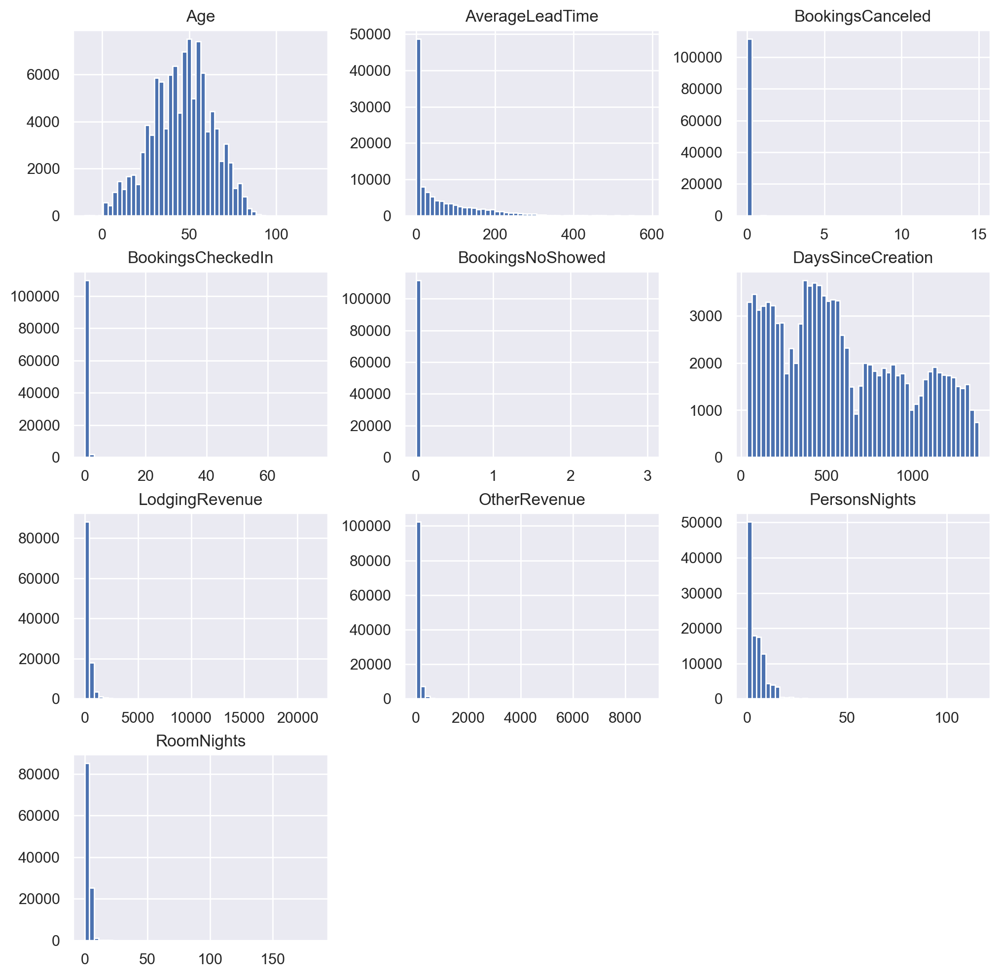

In [12]:
df[numerical].hist(bins=50, figsize=(12,12))
plt.show()


#### 3.4.2 Categorical Variables

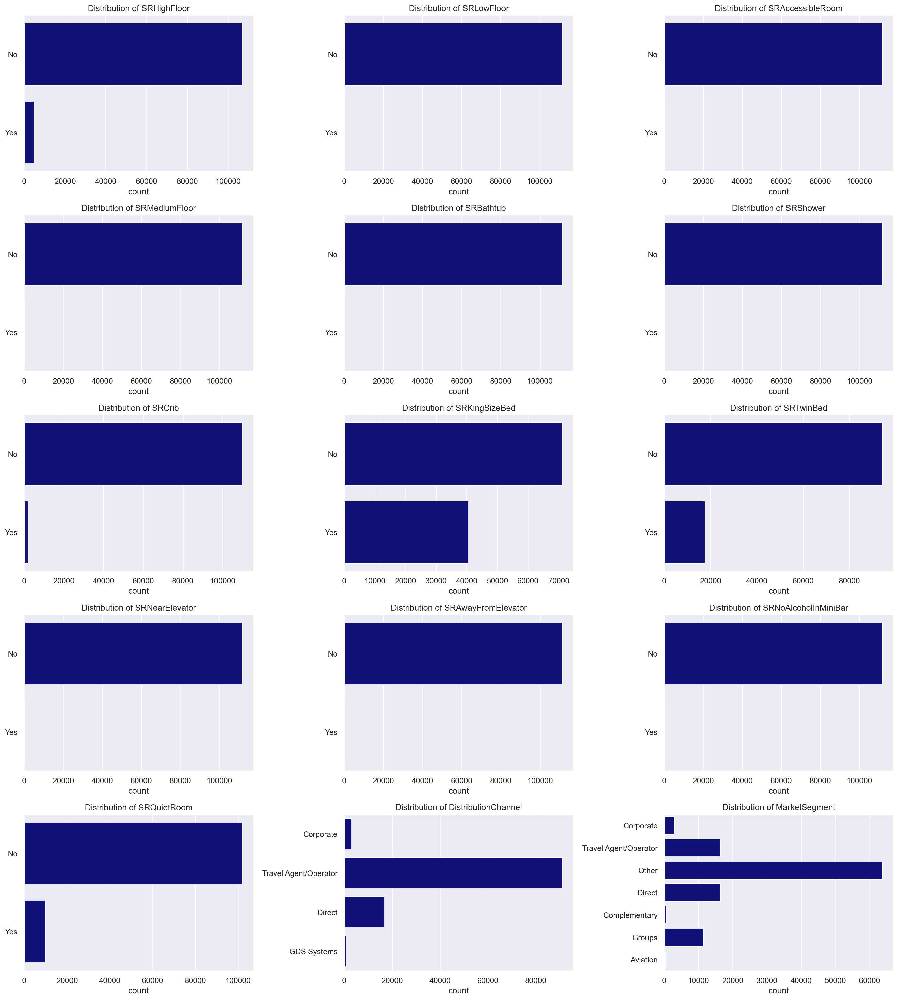

In [13]:
# Create a grid of subplots with 3 plots in each row
fig, axes = plt.subplots(nrows=(len(categorical[:-1]) + 2) // 3, ncols=3, figsize=(18, 4 * ((len(categorical[:-1]) + 2) // 3)))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each non-metric feature and create a countplot
for i, col in enumerate(categorical[:-1]):
    sns.countplot(y=col, data=df[categorical].replace({0: 'No', 1: 'Yes'}), color="darkblue", ax=axes[i])
    axes[i].set_title(f'Distribution of {col}')
    axes[i].set_ylabel('')

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

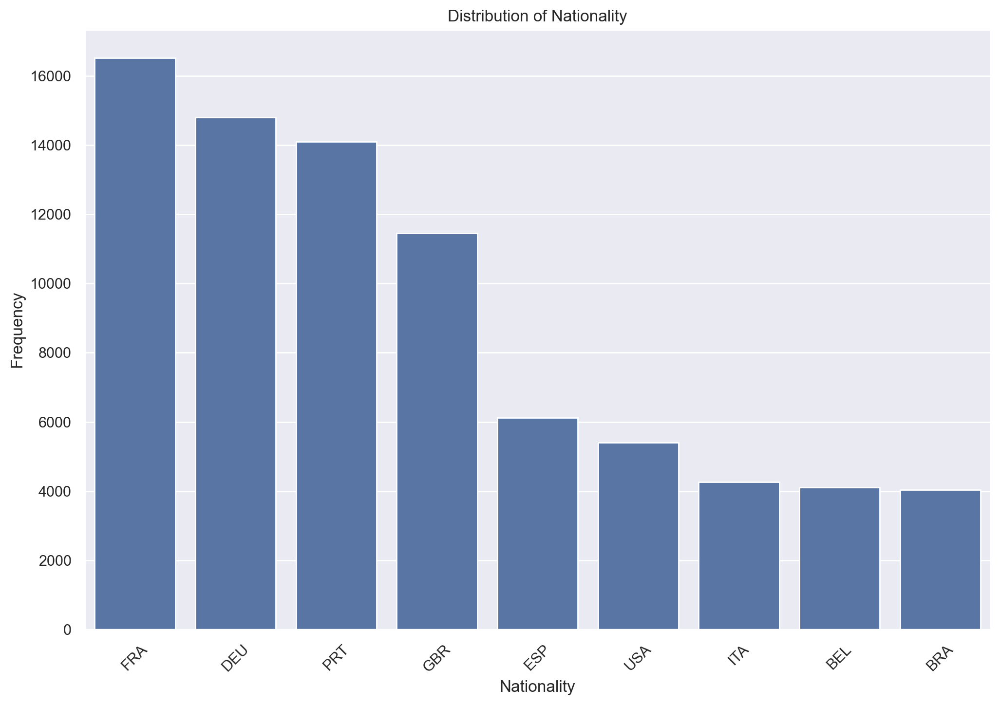

In [14]:
# Calculate the frequency of each nationality
nationality_counts = df['Nationality'].value_counts()

# Define a threshold for grouping less common nationalities
threshold = 4000

# Create a copy of the Nationality column and group less common nationalities into 'Other'
nationality_copy = df['Nationality'].apply(lambda x: x if nationality_counts[x] > threshold else 'Other')

# Calculate the frequency of each grouped nationality
grouped_nationality_counts = nationality_copy.value_counts()

# Exclude the "Other" category
grouped_nationality_counts = grouped_nationality_counts[grouped_nationality_counts.index != 'Other']

# Plot the distribution as a bar plot
plt.figure(figsize=(12, 8))
sns.barplot(x=grouped_nationality_counts.index, y=grouped_nationality_counts.values)
plt.title('Distribution of Nationality')
plt.xlabel('Nationality')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

In [15]:
# Step 1: Count the number of customers per country
country_counts = df['Nationality'].value_counts().reset_index()
country_counts.columns = ['Nationality', 'CustomerCount']

# Step 2: Create the choropleth map with Mollweide projection
fig = px.choropleth(
    country_counts,  # Data
    locations="Nationality",  # Column with country codes
    locationmode="ISO-3",  # Use ISO-3 country codes (e.g., 'USA', 'GBR')
    color="CustomerCount",  # Column to determine color intensity
    hover_name="Nationality",  # Column to display on hover
    color_continuous_scale="Brwnyl",  # Brown color scale
    title="Customer Distribution by Country (Oval Globe)",  # Map title
    labels={'CustomerCount': 'Number of Customers'},  # Label for the color scale
    projection="mollweide"  # Mollweide projection for oval shape
)

# Step 3: Customize the layout for the oval globe
fig.update_layout(
    geo=dict(
        showframe=False,  # Hide the map frame
        showcoastlines=True,  # Show coastlines
        showland=True,  # Show land
        landcolor="lightgray",  # Color of land
        oceancolor="lightblue",  # Color of oceans
        lakecolor="blue",  # Color of lakes
        projection_type="mollweide"  # Mollweide projection for oval shape
    ),
    title_font=dict(size=24, color="brown"),  # Title font and color
    coloraxis_colorbar=dict(title="Customer Count", tickfont=dict(color="brown"))  # Color bar customization
)

# Step 4: Add country borders and resolution
fig.update_geos(
    resolution=110,  # Map resolution
    showcountries=True,  # Show country borders
    countrycolor="black"  # Color of country borders
)

# Step 5: Display the map
fig.show()

### 3.5 Checking for missing values

In [16]:
pd.DataFrame(df.isna().sum().rename('Missing Values Count'))

,Missing Values Count
Nationality,0
Age,4172
DaysSinceCreation,0
AverageLeadTime,0
LodgingRevenue,0
OtherRevenue,0
BookingsCanceled,0
BookingsNoShowed,0
BookingsCheckedIn,0
PersonsNights,0


### 3.6 Checking for duplicated rows

In [6]:
df[df.duplicated()].head()

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,
40,PRT,NaN,1385,0,0.0,0.0,0,0,1,1,1,Direct,Complementary,0,0,0,0,0,0,0,0,0,0,0,0,0
69,FRA,52.0,1385,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
99,ESP,58.0,1384,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,1,0,0,0,0
138,FRA,73.0,1384,97,192.0,50.0,0,0,1,8,4,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
146,FRA,61.0,1384,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0


### 3.7 Checking for outliers

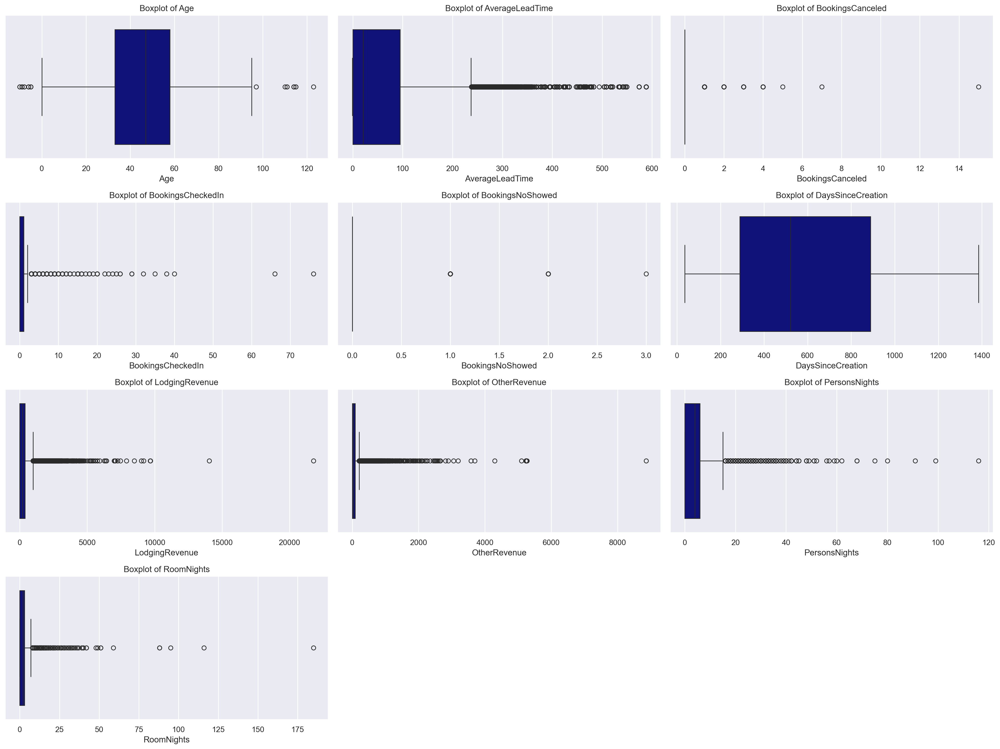

In [18]:
# Create a boxplot for all numerical columns
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each numerical feature and create a horizontal boxplot
for i, col in enumerate(numerical):
    sns.boxplot(x=col, data=df, color="darkblue", ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### 3.8 Vizualizing Anomalies and Strage Cases

#### Negative age values

In [7]:
df[df['Age'] < 0].head()

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,
2053,BIH,-6.0,1324,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
2469,ATF,-6.0,1319,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
5128,FRA,-8.0,1271,66,93.3,14.0,0,0,1,2,1,Travel Agent/Operator,Other,0,0,0,0,0,0,0,1,0,0,0,0,0
6752,GBR,-10.0,1243,22,450.0,18.0,0,0,1,1,1,Travel Agent/Operator,Other,0,0,0,0,0,0,0,1,0,0,0,0,0
8361,DEU,-6.0,1217,256,126.0,109.0,0,0,1,4,2,Travel Agent/Operator,Groups,0,0,0,0,0,0,0,0,1,0,0,0,0


#### Negative AverageLeadTime

In [8]:
df[df['AverageLeadTime'] < 0].head()

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,
23064,PRT,NaN,964,-1,352.00,30.0,0,0,1,2,1,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
29374,USA,25.0,870,-1,77.49,3.0,0,0,1,3,1,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
51375,CHN,33.0,558,-1,129.00,2.0,0,0,1,2,1,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
58655,FRA,57.0,499,-1,149.00,2.0,0,0,1,2,1,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
58662,FRA,62.0,499,-1,149.00,2.0,0,0,1,2,1,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0


#### Revenue without Check-in

In [9]:
df[((df['BookingsCheckedIn'] == 0)) & ((df['LodgingRevenue'] > 0) | (df['OtherRevenue'] > 0))]

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,
70580,PRT,NaN,410,114,249.3,18.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0


#### More Rooms than Persons

In [10]:
df[df['RoomNights'] > df['PersonsNights']].head()

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,
2160,PRT,48.0,1323,20,8493.65,2587.5,3,1,66,75,95,Corporate,Corporate,0,0,0,0,0,0,0,1,0,0,0,0,0
2757,PRT,NaN,1315,57,21781.00,1584.0,1,0,29,62,185,Corporate,Direct,0,0,0,0,0,0,0,0,0,0,0,0,0
2843,PRT,NaN,1314,8,0.00,5105.5,0,0,3,2,12,Travel Agent/Operator,Corporate,0,0,0,0,0,0,0,0,0,0,0,0,0
4196,PRT,45.0,1288,75,138.00,38.5,0,0,2,2,88,Travel Agent/Operator,Groups,0,0,0,0,0,0,0,0,0,0,0,0,0
10151,PRT,66.0,1189,42,826.00,173.0,3,0,13,13,15,Corporate,Corporate,0,0,0,0,0,0,0,1,0,0,0,0,0


#### Clients with 0 Bookings

In [13]:
df[df['BookingsCanceled'] + df['BookingsCheckedIn'] + df['BookingsNoShowed'] == 0].head()

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,
3,DEU,32.0,1385,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
5,FRA,52.0,1385,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
7,JPN,50.0,1385,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,0,0,0,0,0
9,FRA,43.0,1385,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,1,0,0,0,0,0
11,IRL,28.0,1385,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0


### 3.9 Vizualizing Duplicate Rows

In [14]:
# Show duplicates
df[df.duplicated()].head()

,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,RoomNights,DistributionChannel,MarketSegment,SRHighFloor,SRLowFloor,SRAccessibleRoom,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,,,,,,
40,PRT,NaN,1385,0,0.0,0.0,0,0,1,1,1,Direct,Complementary,0,0,0,0,0,0,0,0,0,0,0,0,0
69,FRA,52.0,1385,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
99,ESP,58.0,1384,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Other,0,0,0,0,0,0,0,0,1,0,0,0,0
138,FRA,73.0,1384,97,192.0,50.0,0,0,1,8,4,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0
146,FRA,61.0,1384,0,0.0,0.0,0,0,0,0,0,Travel Agent/Operator,Travel Agent/Operator,0,0,0,0,0,0,0,0,0,0,0,0,0


# 4 Data Preparation

In [5]:
X = df.copy(deep=True)

## 4.1 Removing Duplicates

In [6]:
# Drop duplicates
X.drop_duplicates(inplace=True)

## 4.2 Anomalies dropping and Strange Values treatment

### Anomalies

In [7]:
anomalies = X[(X['AverageLeadTime'] < 0) |
              ((X['BookingsCheckedIn'] == 0) &
               ((X['LodgingRevenue'] > 0) | (X['OtherRevenue'] > 0))) |
              ((X['BookingsCanceled'] + X['BookingsCheckedIn'] + X['BookingsNoShowed']) == 0)]

# Display the filtered dataframe
anomalies.head()


,Nationality,Age,DaysSinceCreation,AverageLeadTime,LodgingRevenue,OtherRevenue,BookingsCanceled,BookingsNoShowed,BookingsCheckedIn,PersonsNights,...,SRMediumFloor,SRBathtub,SRShower,SRCrib,SRKingSizeBed,SRTwinBed,SRNearElevator,SRAwayFromElevator,SRNoAlcoholInMiniBar,SRQuietRoom
ID,,,,,,,,,,,,,,,,,,,,,
3,DEU,32.0,1385,0,0.0,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,FRA,52.0,1385,0,0.0,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,JPN,50.0,1385,0,0.0,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,FRA,43.0,1385,0,0.0,0.0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
11,IRL,28.0,1385,0,0.0,0.0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


We will drop the anomalies now

In [8]:
X.drop(anomalies.index, inplace=True)

### Strange values

The negative age will be treated as an insertion error. It is possible that the minus was mistakenly typed when this data was collected

In [9]:
X["Age"]=X["Age"].abs()

## 4.3 Imputing Missing Values

### Age

> Let's impute customer age with KNN imputer.

In [10]:
# Create a copy of the DataFrame for imputation
df_to_impute = X.copy(deep=True)

# Step 1: Scale the 'Age' column
scaler = StandardScaler()
df_to_impute['Age'] = scaler.fit_transform(df_to_impute[['Age']])

# Step 2: Impute missing values using KNNImputer
imputer = KNNImputer(n_neighbors=5)
df_to_impute['Age'] = imputer.fit_transform(df_to_impute[['Age']])

# Step 3: Reverse scaling for interpretability
df_to_impute['Age'] = scaler.inverse_transform(df_to_impute[['Age']])

# Step 4: Round 'Age' to the nearest integer
df_to_impute["Age"] = df_to_impute["Age"].round().astype(int)

# Step 5: Update the original DataFrame with the imputed values
X[numerical] = df_to_impute[numerical]

print(f"Total number of missing values: {X.isna().sum().sum()}")

Total number of missing values: 0


## 4.4 Feature Engineering

### 4.4.1 Numerical new features

In [11]:
X['TotalRevenue'] = X['LodgingRevenue'] + X['OtherRevenue']
X['SpendingPerCheckin'] = np.where(X['BookingsCheckedIn'] == 0, 0,
                                   X['TotalRevenue'] / X['BookingsCheckedIn'])
X['PersonsPerRoom'] = np.where(X['RoomNights'] == 0, 0,
                            X['PersonsNights'] / X['RoomNights'])

X['TotalBookings'] = X['BookingsCanceled'] + X['BookingsCheckedIn'] + X['BookingsNoShowed']

# Revenue Ratio
X['ExtraRevenueRatio'] = np.where(
    X['LodgingRevenue'] == 0,
    0,
    X['OtherRevenue'] / X['LodgingRevenue'])


X['BookingConversionRate'] = np.where(
    X['TotalBookings'] == 0,
    0,
    X['BookingsCheckedIn'] / X['TotalBookings'])


numerical = numerical + ['TotalRevenue', 'SpendingPerCheckin', 'PersonsPerRoom', 'TotalBookings', 'ExtraRevenueRatio', 'BookingConversionRate']

In [12]:
X["RevenuePerGuest"] = X["TotalRevenue"] / X["PersonsPerRoom"]
# Note: This variable will tell us the Revenue per guest when there is only one room which we assume tends to be the pattern

# Create Average Stay Length feature
X['AvgPersonsPerBooking'] = np.where(
    X['BookingsCheckedIn'] == 0,
    0,
    X['PersonsNights'] / X['BookingsCheckedIn'])

# Create Average Stay Length feature
X['AverageStayLength'] = np.where(
    X['BookingsCheckedIn'] == 0,
    0,
    X['PersonsNights'] / X['BookingsCheckedIn'])

# Nota: ambas estas variáveis são contraditórias

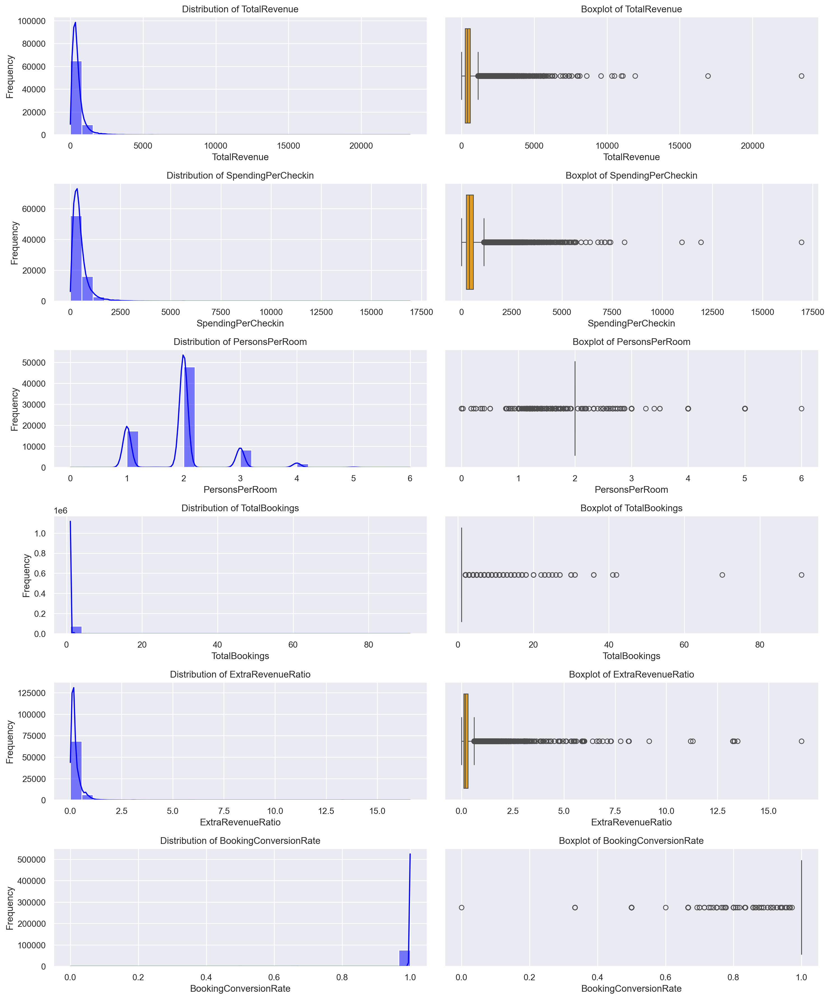

In [12]:
plot_distribution_and_boxplot(X, ['TotalRevenue', 'SpendingPerCheckin', 'PersonsPerRoom', 'TotalBookings', 'ExtraRevenueRatio', 'BookingConversionRate'])

### 4.4.2 Categorical new features

>1. <code>region</code>: country's continent region.
>2. <code>Spending Tier</code>:  Categorize customers into low, medium, and high spenders.
>3. <code>Age Groups</code>: Create bins (e.g., <25, 25-40, 40-60, 60+).
>4. <code>Lead Time Segments</code>: Group AverageLeadTime (e.g., Last-Minute <7 days, Early Planner >30 days).
>5.  <code>Quiet Room Preference Score</code>: SRQuietRoom + SRAwayFromElevator.


In [13]:
iso3_to_region = {
    # Europe
    'PRT': 'Europe', 'DEU': 'Europe', 'FRA': 'Europe', 'IRL': 'Europe',
    'ESP': 'Europe', 'BEL': 'Europe', 'NLD': 'Europe', 'AUT': 'Europe',
    'ITA': 'Europe', 'POL': 'Europe', 'HUN': 'Europe', 'CHE': 'Europe',
    'ROU': 'Europe', 'GBR': 'Europe', 'FIN': 'Europe', 'GRC': 'Europe',
    'BGR': 'Europe', 'SWE': 'Europe', 'DNK': 'Europe', 'NOR': 'Europe',
    'HRV': 'Europe', 'LUX': 'Europe', 'CZE': 'Europe', 'AND': 'Europe',
    'SVN': 'Europe', 'LTU': 'Europe', 'SRB': 'Europe', 'EST': 'Europe',
    'LVA': 'Europe', 'CYP': 'Europe', 'MLT': 'Europe', 'ISL': 'Europe',
    'LIE': 'Europe', 'MCO': 'Europe', 'SMR': 'Europe', 'ALB': 'Europe',
    'MKD': 'Europe', 'MNE': 'Europe', 'BIH': 'Europe', 'BLR': 'Europe',
    'UKR': 'Europe', 'RUS': 'Europe', 'GIB': 'Europe', 'FRO': 'Europe',
    'GGY': 'Europe', 'JEY': 'Europe', 'IMN': 'Europe', 'SJM': 'Europe',
    'SVK':'Europe',
    'ATA': 'Antarctica',  # Antarctica is not part of any continent

    # Asia
    'JPN': 'Asia', 'CHN': 'Asia', 'TWN': 'Asia', 'KOR': 'Asia',
    'IND': 'Asia', 'IDN': 'Asia', 'THA': 'Asia', 'PHL': 'Asia',
    'MYS': 'Asia', 'VNM': 'Asia', 'KAZ': 'Asia', 'UZB': 'Asia',
    'TJK': 'Asia', 'KGZ': 'Asia', 'TKM': 'Asia', 'AFG': 'Asia',
    'PAK': 'Asia', 'BGD': 'Asia', 'LKA': 'Asia', 'NPL': 'Asia',
    'MMR': 'Asia', 'LAO': 'Asia', 'KHM': 'Asia', 'SGP': 'Asia',
    'BRN': 'Asia', 'MDV': 'Asia', 'ARE': 'Asia', 'SAU': 'Asia',
    'QAT': 'Asia', 'KWT': 'Asia', 'BHR': 'Asia', 'OMN': 'Asia',
    'YEM': 'Asia', 'IRQ': 'Asia', 'SYR': 'Asia', 'JOR': 'Asia',
    'LBN': 'Asia', 'ISR': 'Asia', 'PSE': 'Asia', 'GEO': 'Asia',
    'ARM': 'Asia', 'AZE': 'Asia', 'TUR': 'Asia', 'CYP': 'Asia',
    'HKG': 'Asia', 'MAC': 'Asia', 'TLS': 'Asia', 'MNG': 'Asia',
    'PRK': 'Asia', 'KIR': 'Oceania',  # Kiribati is in Oceania
    'FSM': 'Oceania',  # Federated States of Micronesia is in Oceania
    'PLW': 'Oceania',  # Palau is in Oceania
    'NRU': 'Oceania',  # Nauru is in Oceania
    'MHL': 'Oceania',  # Marshall Islands is in Oceania
    'WSM': 'Oceania',  # Samoa is in Oceania
    'TON': 'Oceania',  # Tonga is in Oceania
    'VUT': 'Oceania',  # Vanuatu is in Oceania
    'SLB': 'Oceania',  # Solomon Islands is in Oceania
    'PNG': 'Oceania',  # Papua New Guinea is in Oceania
    'FJI': 'Oceania',  # Fiji is in Oceania
    'NCL': 'Oceania',  # New Caledonia is in Oceania
    'PYF': 'Oceania',  # French Polynesia is in Oceania
    'COK': 'Oceania',  # Cook Islands is in Oceania
    'TUV': 'Oceania',  # Tuvalu is in Oceania
    'WLF': 'Oceania',  # Wallis and Futuna is in Oceania
    'ASM': 'Oceania',  # American Samoa is in Oceania
    'GUM': 'Oceania',  # Guam is in Oceania
    'MNP': 'Oceania',  # Northern Mariana Islands is in Oceania
    'UMI': 'Oceania',  # United States Minor Outlying Islands is in Oceania
    'PCN': 'Oceania',  # Pitcairn Islands is in Oceania

    # Africa
    'AGO': 'Africa', 'ZAF': 'Africa', 'MAR': 'Africa', 'EGY': 'Africa',
    'TUN': 'Africa', 'MOZ': 'Africa', 'KEN': 'Africa', 'TZA': 'Africa',
    'UGA': 'Africa', 'COD': 'Africa', 'DZA': 'Africa', 'LBY': 'Africa',
    'GNB': 'Africa', 'CPV': 'Africa', 'SEN': 'Africa', 'MLI': 'Africa',
    'NER': 'Africa', 'TCD': 'Africa', 'CAF': 'Africa', 'CMR': 'Africa',
    'GAB': 'Africa', 'GNQ': 'Africa', 'STP': 'Africa', 'BEN': 'Africa',
    'TGO': 'Africa', 'GHA': 'Africa', 'CIV': 'Africa', 'LBR': 'Africa',
    'SLE': 'Africa', 'GIN': 'Africa', 'GNB': 'Africa', 'MRT': 'Africa',
    'ERI': 'Africa', 'DJI': 'Africa', 'SOM': 'Africa', 'ETH': 'Africa',
    'BDI': 'Africa', 'RWA': 'Africa', 'MWI': 'Africa', 'ZWE': 'Africa',
    'ZMB': 'Africa', 'NAM': 'Africa', 'BWA': 'Africa', 'LSO': 'Africa',
    'SWZ': 'Africa', 'MDG': 'Africa', 'COM': 'Africa', 'MUS': 'Africa',
    'SYC': 'Africa', 'REU': 'Africa', 'MYT': 'Africa', 'ATF': 'Africa',
    'IOT': 'Africa', 'SHN': 'Africa', 'NGA': 'Africa', 'BFA': 'Africa',
    'SDN': 'Africa',

    # North America
    'USA': 'North America', 'CAN': 'North America', 'MEX': 'North America',
    'CRI': 'North America', 'PAN': 'North America', 'GTM': 'North America',
    'HND': 'North America', 'NIC': 'North America', 'SLV': 'North America',
    'BLZ': 'North America', 'DOM': 'North America', 'HTI': 'North America',
    'JAM': 'North America', 'CUB': 'North America', 'PRI': 'North America',
    'BHS': 'North America', 'TTO': 'North America', 'BRB': 'North America',
    'GRD': 'North America', 'LCA': 'North America', 'VCT': 'North America',
    'KNA': 'North America', 'AIA': 'North America', 'ATG': 'North America',
    'DMA': 'North America', 'MSR': 'North America', 'SXM': 'North America',
    'CYM': 'North America', 'VGB': 'North America', 'VIR': 'North America',
    'ABW': 'North America', 'BMU': 'North America', 'GLP': 'North America',
    'MTQ': 'North America', 'SPM': 'North America', 'KNA': 'North America',
    'CUW': 'North America', 'MAF': 'North America', 'BLM': 'North America',

    # South America
    'BRA': 'South America', 'ARG': 'South America', 'CHL': 'South America',
    'COL': 'South America', 'PER': 'South America', 'URY': 'South America',
    'PRY': 'South America', 'BOL': 'South America', 'ECU': 'South America',
    'VEN': 'South America', 'GUY': 'South America', 'SUR': 'South America',
    'FLK': 'South America', 'GUF': 'South America',

    # Oceania
    'AUS': 'Oceania', 'NZL': 'Oceania', 'PNG': 'Oceania', 'FJI': 'Oceania',
    'SLB': 'Oceania', 'VUT': 'Oceania', 'NCL': 'Oceania', 'PYF': 'Oceania',
    'COK': 'Oceania', 'WSM': 'Oceania', 'TON': 'Oceania', 'KIR': 'Oceania',
    'MHL': 'Oceania', 'FSM': 'Oceania', 'PLW': 'Oceania', 'NRU': 'Oceania',
    'TUV': 'Oceania', 'WLF': 'Oceania', 'ASM': 'Oceania', 'GUM': 'Oceania',
    'MNP': 'Oceania', 'PCN': 'Oceania', 'UMI': 'Oceania',

    # Middle East
    'TUR': 'Middle East', 'ISR': 'Middle East', 'ARE': 'Middle East',
    'KWT': 'Middle East', 'SAU': 'Middle East', 'QAT': 'Middle East',
    'IRN': 'Middle East', 'JOR': 'Middle East', 'LBN': 'Middle East',
    'SYR': 'Middle East', 'YEM': 'Middle East', 'OMN': 'Middle East',
    'BHR': 'Middle East', 'PSE': 'Middle East', 'IRQ': 'Middle East',
    'AFG': 'Middle East', 'PAK': 'Middle East'
}

# Assign Region to dataset based on Nationality (ISO3 code)
X['Continent'] = X['Nationality'].map(iso3_to_region)


X["BookingType"] = np.select(
    [
        X["PersonsPerRoom"] > 1,  # More than 1 person per room
        X["PersonsPerRoom"] == 1, # Exactly 1 person per room
        X["PersonsPerRoom"] < 1   # Less than 1 person per room
    ],
    [
        "Shared",  # More than 1 person
        "Single",              # Exactly 1 person
        "For collaborators"
    ],
    default="Unknown"  # Fallback case (shouldn't happen if data is clean)
)

# Define Spending Tier limits based on Total_Revenue_Per_Stay quartiles
spending_tier_bins = [-float('inf'), 368.25, float('inf')]  # Ensures 0 is included
spending_tier_labels = ['Low Spender', 'High Spender']

# Create Spending Tier feature
X['SpendingTier'] = pd.cut(X['TotalRevenue'],
                                  bins=spending_tier_bins,
                                  labels=spending_tier_labels,
                                  include_lowest=True)  # Includes 0 in 'Low Spender'

# 2. Age Groups - Binning Age into categories
X['AgeGroup'] = pd.cut(
    X['Age'],  # Fill NaN with a value that won't match any bin
    bins=[0, 30, 50, float('inf')],
    labels=['<30', '30-50', '50+']
)

# 3. Lead Time Segments - Binning AverageLeadTime into categories
X['LeadTimeSegment'] = pd.cut(
    X['AverageLeadTime'],  # Fill NaN with a value that won't match any bin
    bins=[0, 7, 30, float('inf')],
    labels=['Last-Minute (<7 Days)', 'Standard (7-30 Days)', 'Early Planner (>30 Days)']
)


# Define conditions
conditions = [
    (X[['SRHighFloor', 'SRLowFloor', 'SRMediumFloor']].sum(axis=1) == 0),
    (X['SRHighFloor'] == 1) & (X[['SRLowFloor', 'SRMediumFloor']].sum(axis=1) == 0),
    (X['SRLowFloor'] == 1) & (X[['SRHighFloor', 'SRMediumFloor']].sum(axis=1) == 0),
    (X['SRMediumFloor'] == 1) & (X[['SRHighFloor', 'SRLowFloor']].sum(axis=1) == 0),
]

categories = ['Not specified', 'HighFloor', 'LowFloor', 'MediumFloor']
X['FloorAsked'] = np.select(conditions, categories, default="Other")

conditions = [
    (X[['SRShower', 'SRBathtub']].sum(axis=1) == 0),
    (X['SRShower'] == 1) & (X[['SRBathtub']].sum(axis=1) == 0),
    (X['SRBathtub'] == 1) & (X[['SRShower']].sum(axis=1) == 0),
]

categories = ['Not specified', 'Shower', 'Bathtub']
X['BathAsked'] = np.select(conditions, categories, default="Other")

conditions = [
    (X[['SRKingSizeBed', 'SRTwinBed']].sum(axis=1) == 0),
    (X['SRKingSizeBed'] == 1) & (X[['SRTwinBed']].sum(axis=1) == 0),
    (X['SRTwinBed'] == 1) & (X[['SRKingSizeBed']].sum(axis=1) == 0),
]

categories = ['Not specified', 'KingSizeBed', 'TwinBed']
X['BedAsked'] = np.select(conditions, categories, default="Other")

conditions = [
    (X[['SRAwayFromElevator', 'SRNearElevator']].sum(axis=1) == 0),
    (X['SRAwayFromElevator'] == 1) & (X[['SRNearElevator']].sum(axis=1) == 0),
    (X['SRNearElevator'] == 1) & (X[['SRAwayFromElevator']].sum(axis=1) == 0),
]

categories = ['Not specified', 'Away from elevator', 'Near Elevator']
X['DistanceElevatorAsked'] = np.select(conditions, categories, default="Other")

# Drop columns after creating new ones
X.drop(columns=["SRHighFloor", "SRLowFloor", "SRMediumFloor", "SRShower", "SRBathtub", "SRKingSizeBed", "SRTwinBed", "SRAwayFromElevator", "SRNearElevator"], inplace=True)

categorical += ['Continent', 'BookingType', 'SpendingTier', 'AgeGroup', 'LeadTimeSegment', 'FloorAsked', 'BathAsked', 'BedAsked', 'DistanceElevatorAsked']


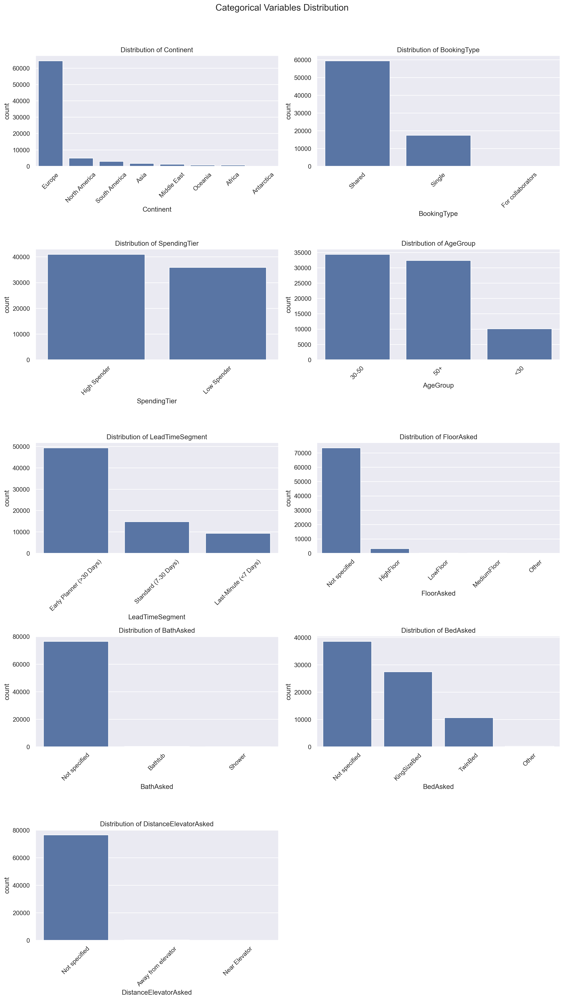

In [16]:
plot_categorical_distributions(X, ['Continent', 'BookingType', 'SpendingTier', 'AgeGroup', 'LeadTimeSegment', 'FloorAsked', 'BathAsked', 'BedAsked', 'DistanceElevatorAsked'])

## 4.5 Multivariate Analysis

### Distribution Channel vs Revenue per stay

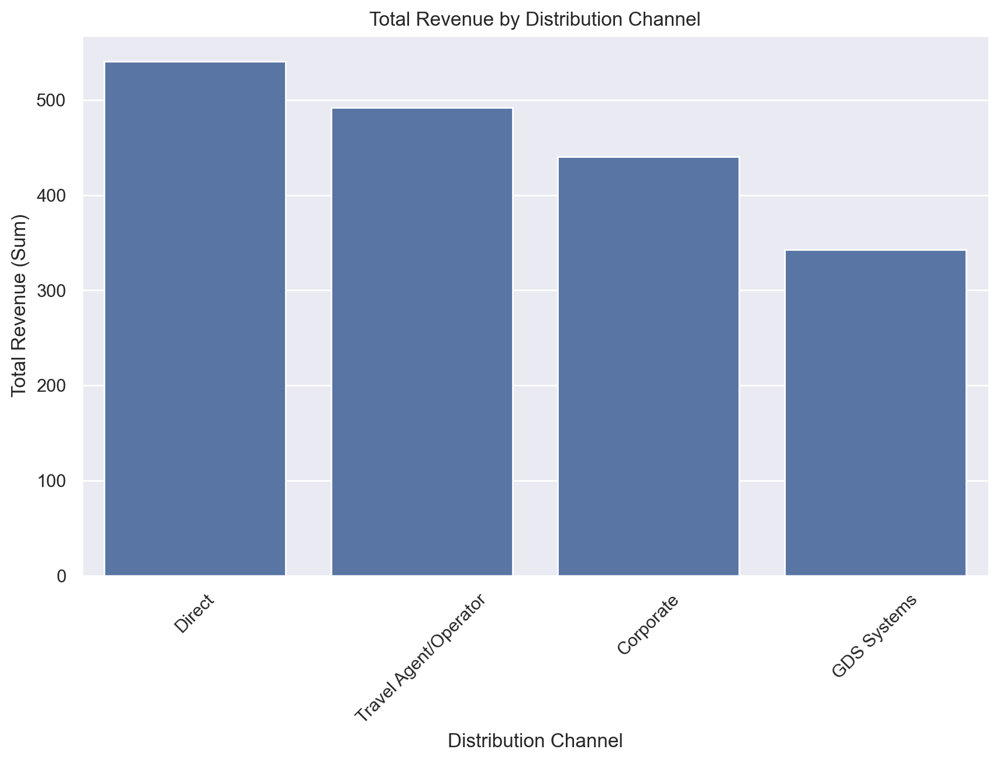

In [16]:
total_revenue_segment = X.groupby("DistributionChannel")["TotalRevenue"].mean().sort_values(ascending=False)

# Plot bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=total_revenue_segment.index, y=total_revenue_segment.values)

plt.xlabel("Distribution Channel")
plt.ylabel("Total Revenue (Sum)")
plt.title("Total Revenue by Distribution Channel")
plt.xticks(rotation=45)  # Rotate labels if needed
plt.show()

### Cancelled/No Show rate per region

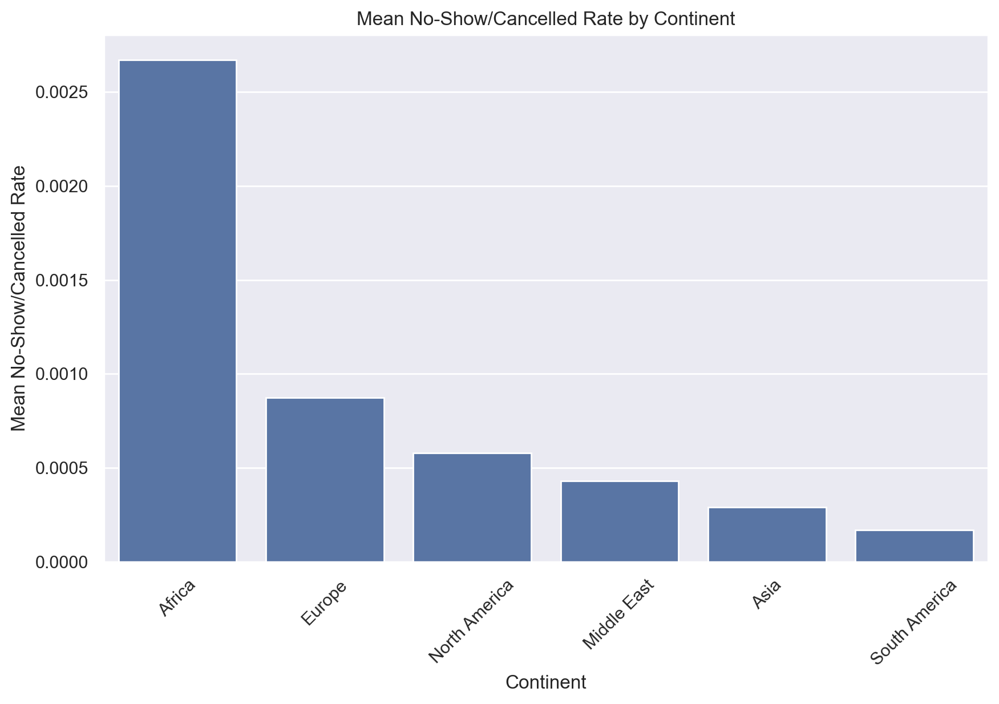

In [17]:
# Calculate the mean of (1 - BookingConversionRate) for each continent
total_noshow = X.groupby("Continent")["BookingConversionRate"].mean()
mean_noshow_rate = 1 - total_noshow  # Compute 1 - mean(BookingConversionRate)

# Filter out regions with very low No-Show Rate (e.g., below 1% of the max)
threshold = mean_noshow_rate.max() * 0.01
filtered_noshow = mean_noshow_rate[mean_noshow_rate > threshold].sort_values(ascending=False)

# Plot bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=filtered_noshow.index, y=filtered_noshow.values)

plt.xlabel("Continent")
plt.ylabel("Mean No-Show/Cancelled Rate")
plt.title("Mean No-Show/Cancelled Rate by Continent")
plt.xticks(rotation=45)  # Rotate labels for readability
plt.show()

### Revenue for age group

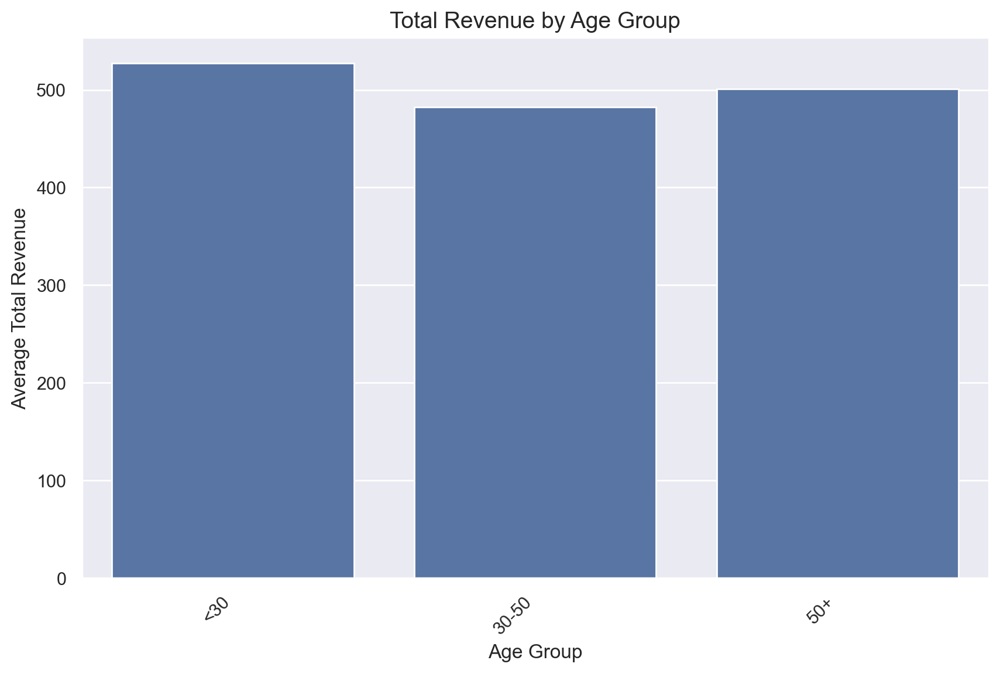

In [18]:
# Calculate mean revenue per age group
age_revenue = X.groupby('AgeGroup', observed=False)['TotalRevenue'].mean()

# Set figure size and style
plt.figure(figsize=(10, 6))
sns.barplot(x=age_revenue.index, y=age_revenue.values)

# Customize chart
plt.xlabel("Age Group", fontsize=12)
plt.ylabel("Average Total Revenue", fontsize=12)
plt.title("Total Revenue by Age Group", fontsize=14)
plt.xticks(rotation=45, ha="right")  # Rotate for better readability

# Show plot
plt.show()

### Total Cancellations and No Shows per Distribution Channel

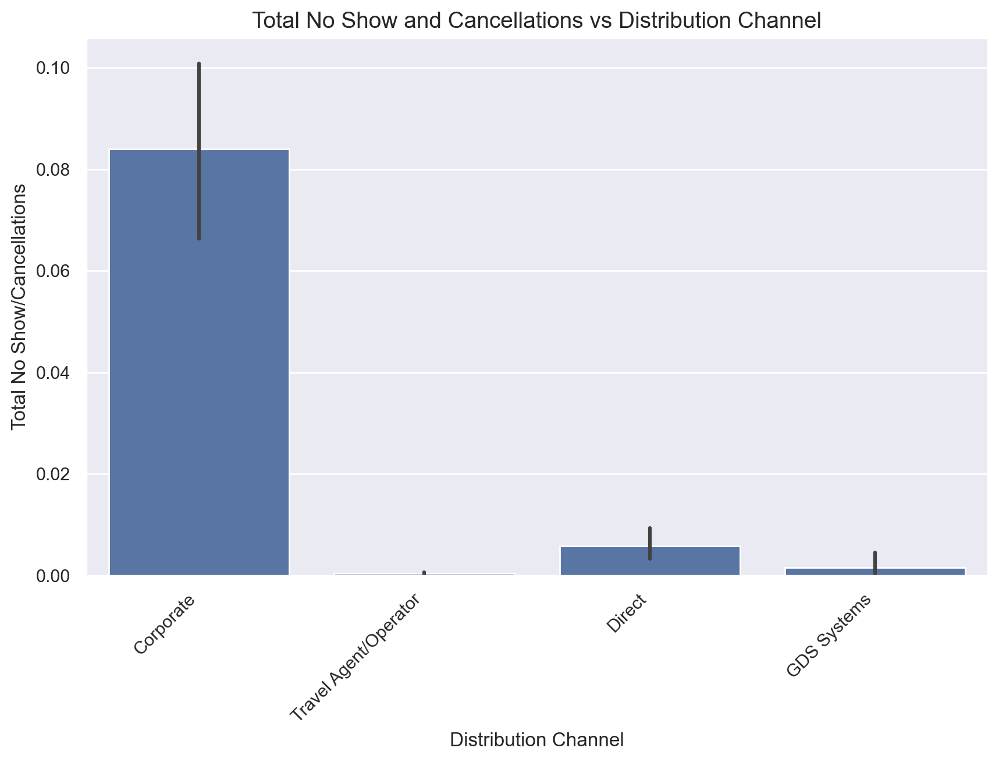

In [19]:
# Create a new column summing canceled and no-show bookings
X["BookingsCancelledAndNoShow"] = X["BookingsCanceled"] + X["BookingsNoShowed"]

# Set figure size
plt.figure(figsize=(10, 6))

# Plot bar chart
sns.barplot(data=X, x='DistributionChannel', y='BookingsCancelledAndNoShow')

# Adding labels and title
plt.title('Total No Show and Cancellations vs Distribution Channel', fontsize=14)
plt.xlabel('Distribution Channel', fontsize=12)
plt.ylabel('Total No Show/Cancellations', fontsize=12)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha="right")

# Show plot
plt.show()

X.drop(columns=["BookingsCancelledAndNoShow"], inplace=True)

### Total Revenue per Booking Type

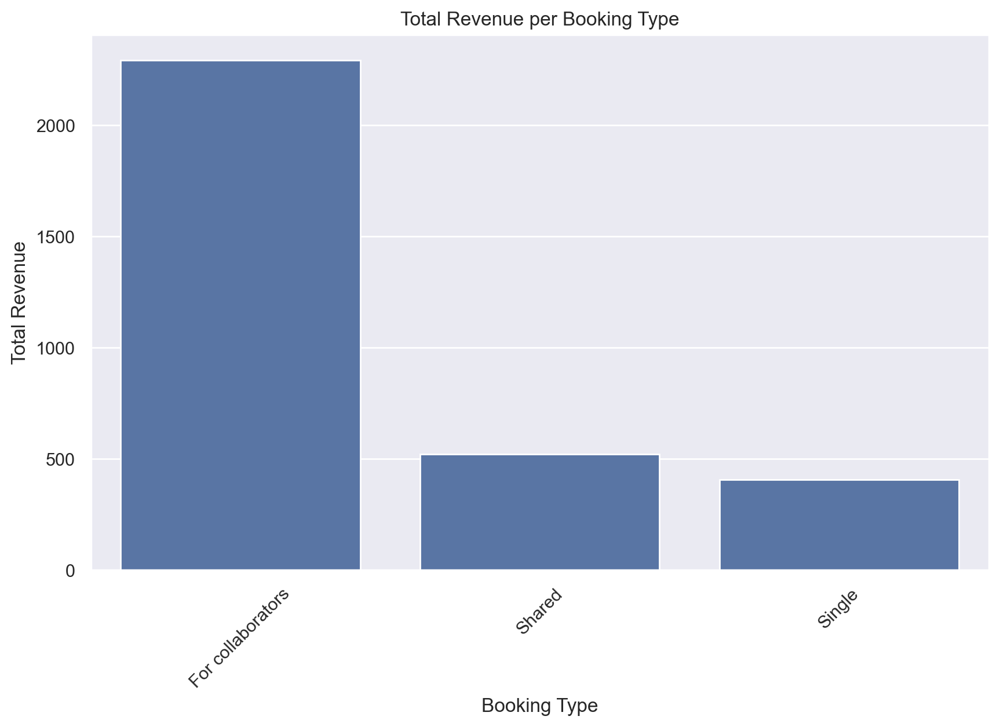

In [20]:
# Calculate the mean of (1 - BookingConversionRate) for each continent
btype_revenue = X.groupby("BookingType")["TotalRevenue"].mean()

# Plot bar chart
plt.figure(figsize=(10, 6))
sns.barplot(x=btype_revenue.index, y=btype_revenue.values)

plt.xlabel("Booking Type")
plt.ylabel("Total Revenue")
plt.title("Total Revenue per Booking Type")
plt.xticks(rotation=45)  # Rotate labels for readability
plt.show()

C:\Users\afons\AppData\Local\Temp\ipykernel_18724\427657650.py:12: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  X.groupby(["Continent", "SpendingTier"]).size() / X.groupby(["Continent"])["SpendingTier"].size()


<Figure size 1500x500 with 0 Axes>

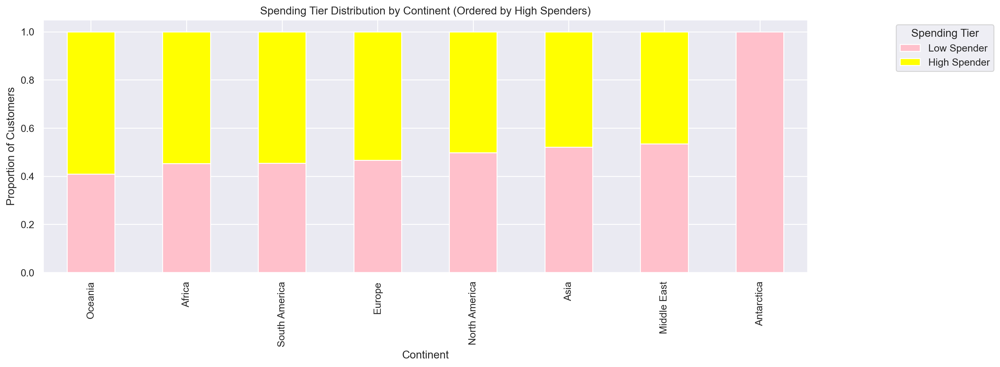

<Figure size 1500x500 with 0 Axes>

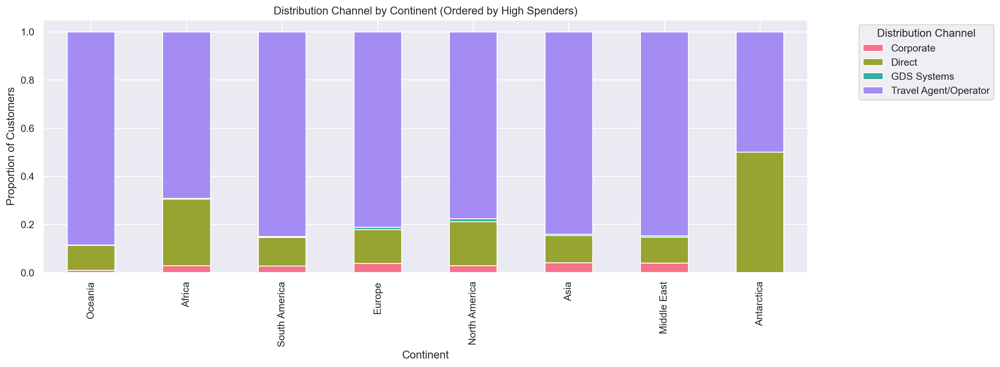

C:\Users\afons\AppData\Local\Temp\ipykernel_18724\427657650.py:64: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  X.groupby(["Continent", "LeadTimeSegment"]).size() / X.groupby(["Continent"])["LeadTimeSegment"].size()


<Figure size 1500x500 with 0 Axes>

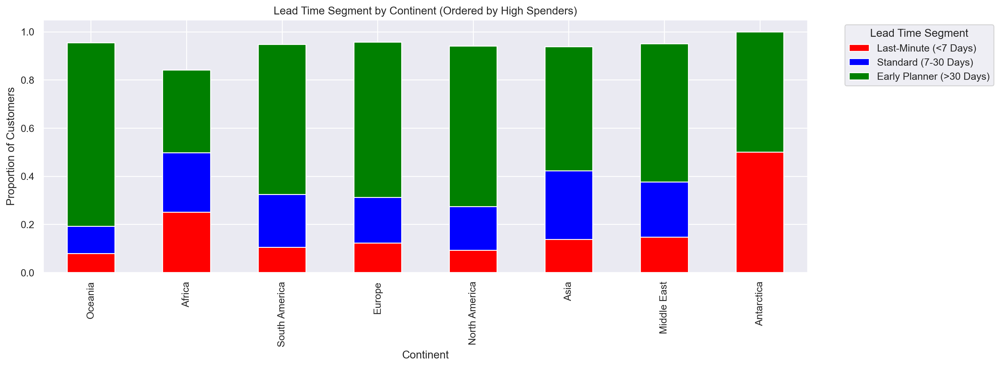

In [21]:
# Define main segmentation feature
main_cat = "Continent"

# Custom colors for Spending Tier visualization
spending_colors = {
    "Low Spender": "pink",
    "High Spender": "yellow",
}

# Calculate the proportion of each spending tier by region
spending_tier_by_continent = (
    X.groupby(["Continent", "SpendingTier"]).size() / X.groupby(["Continent"])["SpendingTier"].size()
).unstack()

# Sort regions by the proportion of High Spenders
spending_tier_by_continent = spending_tier_by_continent.sort_values(by="High Spender", ascending=False)

# Stacked bar chart: Spending Tier by Region (ordered by High Spenders)
plt.figure(figsize=(15, 5))
spending_tier_by_continent.plot(
    kind='bar',
    stacked=True,
    figsize=(15, 5),
    color=[spending_colors[tier] for tier in spending_tier_by_continent.columns]
)

plt.title("Spending Tier Distribution by Continent (Ordered by High Spenders)")
plt.legend(title="Spending Tier", loc='upper right', bbox_to_anchor=(1.25, 1))
plt.xlabel("Continent")
plt.ylabel("Proportion of Customers")
plt.show()

# ---- Additional Visualizations for Deeper Insights ----

# Custom colors for Market Segment
market_colors = sns.color_palette("husl", n_colors=X["DistributionChannel"].nunique())

# Market Segment Distribution by Region
market_segment_by_continent = (
    X.groupby(["Continent", "DistributionChannel"]).size() / X.groupby(["Continent"])["DistributionChannel"].size()
).unstack()

# Sort regions by the proportion of High Spenders (to maintain consistency)
market_segment_by_continent = market_segment_by_continent.loc[spending_tier_by_continent.index]

plt.figure(figsize=(15, 5))
market_segment_by_continent.plot(
    kind='bar',
    stacked=True,
    figsize=(15, 5),
    color=market_colors
)

plt.title("Distribution Channel by Continent (Ordered by High Spenders)")
plt.legend(title="Distribution Channel", loc='upper right', bbox_to_anchor=(1.25, 1))
plt.xlabel("Continent")
plt.ylabel("Proportion of Customers")
plt.show()

# Lead Time Segment Analysis
lead_time_colors = {"Last-Minute (<7 Days)": "red", "Standard (7-30 Days)": "blue", "Early Planner (>30 Days)": "green"}

lead_time_by_continent = (
    X.groupby(["Continent", "LeadTimeSegment"]).size() / X.groupby(["Continent"])["LeadTimeSegment"].size()
).unstack()

# Sort regions by the proportion of High Spenders (to maintain consistency)
lead_time_by_continent = lead_time_by_continent.loc[spending_tier_by_continent.index]

plt.figure(figsize=(15, 5))
lead_time_by_continent.plot(
    kind='bar',
    stacked=True,
    figsize=(15, 5),
    color=[lead_time_colors[segment] for segment in lead_time_by_continent.columns]
)

plt.title("Lead Time Segment by Continent (Ordered by High Spenders)")
plt.legend(title="Lead Time Segment", loc='upper right', bbox_to_anchor=(1.25, 1))
plt.xlabel("Continent")
plt.ylabel("Proportion of Customers")
plt.show()

## 4.6 Feature Selection

In [17]:
def correlation_pairs(data, variables, threshold):
    correlation_matrix = data[variables].corr()

    # Get the absolute values of the correlation matrix
    abs_corr_matrix = correlation_matrix.abs()

    # Identify pairs with high correlation, avoiding duplicates by only considering the upper triangular matrix
    high_corr_pairs = [
        (feature_1, feature_2, float(abs_corr_matrix.loc[feature_1, feature_2]))
        for i, feature_1 in enumerate(abs_corr_matrix.columns)
        for j, feature_2 in enumerate(abs_corr_matrix.columns)
        if i < j and abs_corr_matrix.loc[feature_1, feature_2] > threshold
    ]

    return high_corr_pairs

correlation_pairs(X, numerical, 0.75)

[('BookingsCheckedIn', 'TotalBookings', 0.993735728680995),
 ('LodgingRevenue', 'TotalRevenue', 0.9635538333855764),
 ('LodgingRevenue', 'SpendingPerCheckin', 0.8965381943691966),
 ('PersonsNights', 'RoomNights', 0.7847700056527245),
 ('TotalRevenue', 'SpendingPerCheckin', 0.9331719325346175)]

In [18]:
X.drop(['TotalBookings', 'LodgingRevenue', 'PersonsNights'], axis=1, inplace=True)

numerical = [x for x in numerical if x not in ['TotalBookings', 'LodgingRevenue', 'PersonsNights']]

In [19]:
correlation_pairs(X, numerical, 0.75)

[('TotalRevenue', 'SpendingPerCheckin', 0.9331719325346175)]

### Correlation matrix

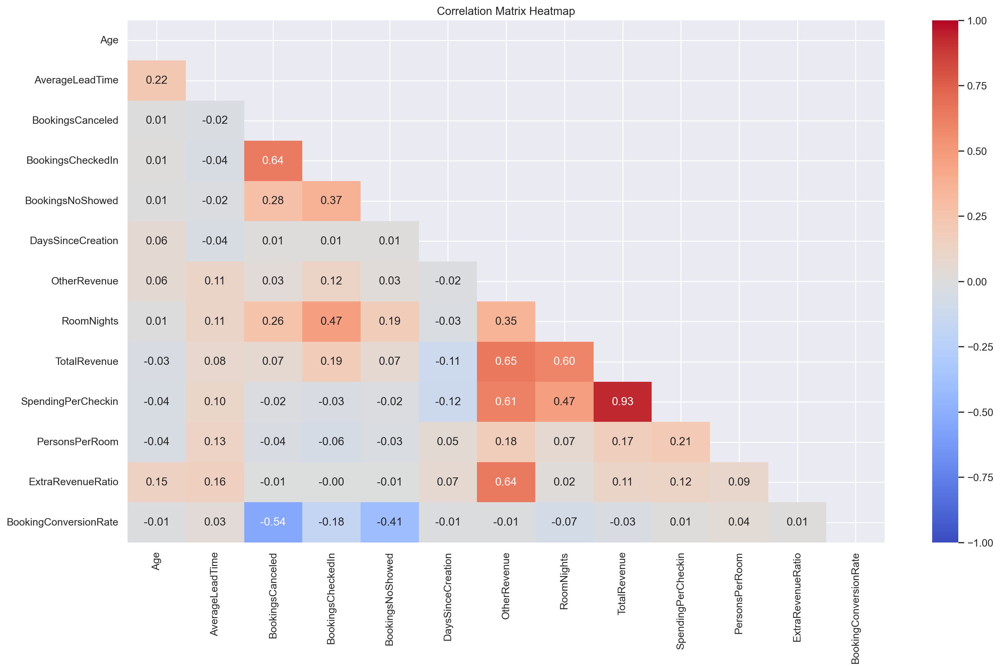

In [20]:
correlation_matrix = X[numerical].corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Plot the heatmap with the mask
plt.figure(figsize=(18, 10))  # Set the figure size
sns.heatmap(correlation_matrix, mask=mask, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Correlation Matrix Heatmap")
plt.show()

## 4.7 Data Skewness

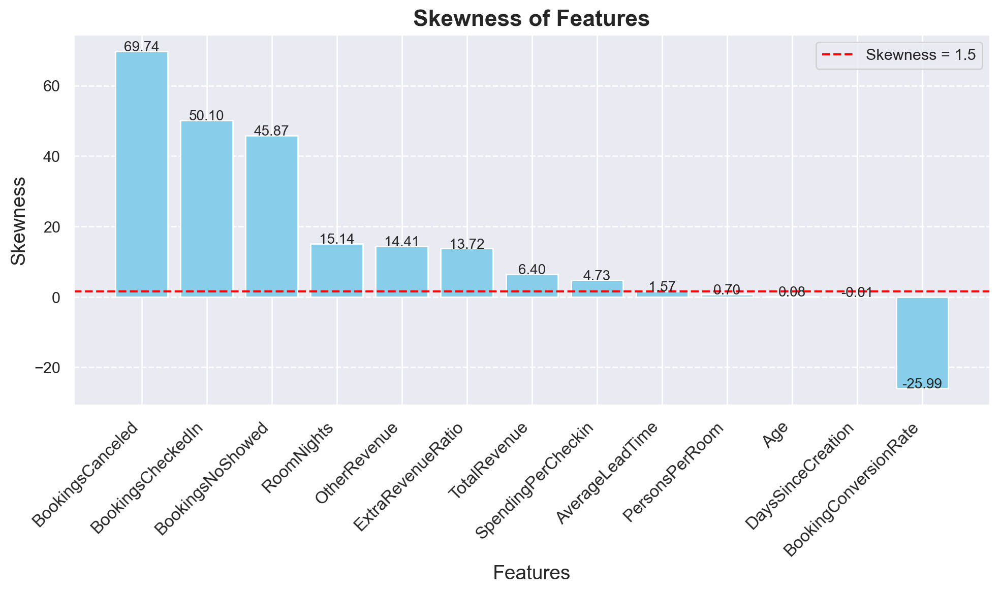

Features with skewness above 1.5: ['BookingsCanceled', 'BookingsCheckedIn', 'BookingsNoShowed', 'RoomNights', 'OtherRevenue', 'ExtraRevenueRatio', 'TotalRevenue', 'SpendingPerCheckin', 'AverageLeadTime']


In [21]:
skewness = X[numerical].apply(lambda x: skew(x, nan_policy='omit'))

sorted_skewness = skewness.sort_values(ascending=False)

plt.figure(figsize=(10, 6))
bars = plt.bar(sorted_skewness.index, sorted_skewness, color='skyblue')
plt.axhline(y=1.5, color='red', linestyle='--', label="Skewness = 1.5")
plt.title("Skewness of Features", fontsize=16, fontweight='bold')
plt.xlabel("Features", fontsize=14)
plt.ylabel("Skewness", fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height + 0.1, f'{height:.2f}', ha='center', fontsize=10)

plt.grid(True, axis='y', linestyle='--', alpha=1)
plt.legend()
plt.tight_layout()
plt.show()

high_skew_features = sorted_skewness[sorted_skewness > 1.5].index.tolist()
print(f"Features with skewness above 1.5: {high_skew_features}")

Transforming high skew features into log scale

In [23]:
for column in high_skew_features:
    X[f'{column}_log'] = np.log1p(X[column])
    numerical = numerical + [f'{column}_log']

num_rows = (len(high_skew_features) * 2 + 1) // 2
num_cols = 2

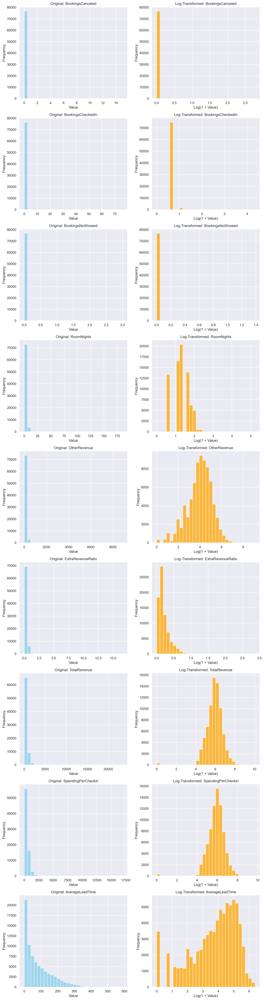

In [24]:
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(12, 5 * num_rows))

axes = axes.flatten()

for i, column in enumerate(high_skew_features):
    if i * 2 < len(axes):  # Ensure there are enough axes
        # Plot original column histogram
        sns.histplot(X[column], kde=False, ax=axes[i * 2], color='skyblue', bins=30)
        axes[i * 2].set_title(f"Original: {column}")
        axes[i * 2].set_xlabel("Value")
        axes[i * 2].set_ylabel("Frequency")

        # Plot log-transformed column histogram
        sns.histplot(X[f'{column}_log'], kde=False, ax=axes[i * 2 + 1], color='orange', bins=30)
        axes[i * 2 + 1].set_title(f"Log-Transformed: {column}")
        axes[i * 2 + 1].set_xlabel("Log(1 + Value)")
        axes[i * 2 + 1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [25]:
original_skewness = X[high_skew_features].apply(lambda x: skew(x, nan_policy='omit'))

log_skewness = X[[f'{column}_log' for column in high_skew_features]].apply(lambda x: skew(x, nan_policy='omit'))

skew_comparison_original = pd.DataFrame({
    'Skewness': original_skewness
})

skew_comparison_log = pd.DataFrame({
    'Skewness after log': log_skewness
})

skew_comparison_original.reset_index(inplace=True)
skew_comparison_log.reset_index(inplace=True)

skew_comparison_original.rename(columns={'index': 'Feature'}, inplace=True)
skew_comparison_log.rename(columns={'index': 'Feature log'}, inplace=True)

skew_comparison = pd.concat([skew_comparison_original, skew_comparison_log], axis=1)

skew_comparison.drop(columns=['Feature log'], inplace=True)

skew_comparison


,Feature,Skewness,Skewness after log
0,BookingsCanceled,69.742734,27.635530
1,BookingsCheckedIn,50.099598,12.029618
2,BookingsNoShowed,45.872335,39.754976
3,RoomNights,15.140994,0.202907
4,OtherRevenue,14.405208,-0.499097
5,ExtraRevenueRatio,13.722184,2.698710
6,TotalRevenue,6.399803,-1.601230
7,SpendingPerCheckin,4.726469,-1.652837
8,AverageLeadTime,1.568886,-0.820697


Updating list of variables and dataset

In [26]:
for var in high_skew_features:
    numerical.remove(var)
    X.drop(columns=[var], inplace=True)

## 4.8 Outlier Removal with Transformed Outliers

C:\Users\afons\PycharmProjects\BC\functions.py:204: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.96])


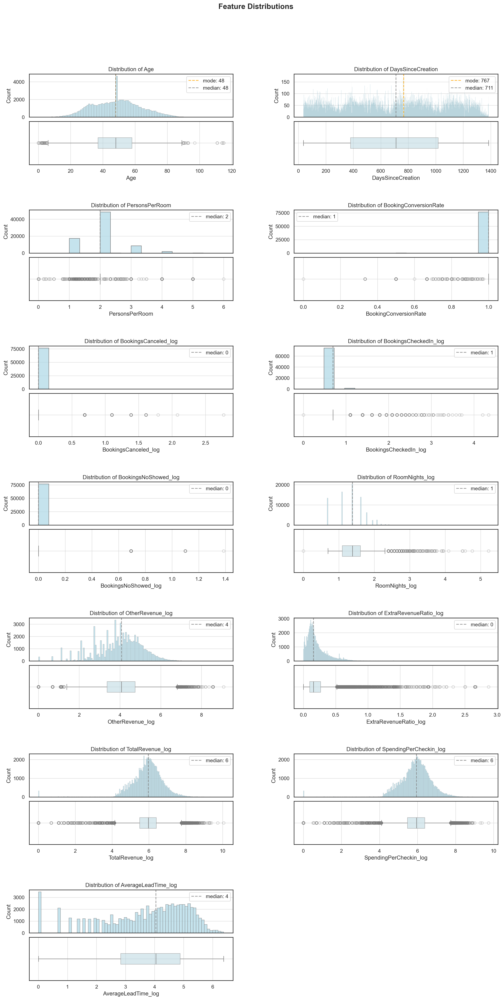

In [27]:
plot_distribution_grid(X, numerical)

### 4.8.1 Outlier Removal of Existing Variables

Columns with right outliers (percentile): ['PersonsPerRoom', 'BookingsCheckedIn_log', 'ExtraRevenueRatio_log']
Columns with right outliers (IQR): ['RoomNights_log', 'OtherRevenue_log', 'TotalRevenue_log', 'SpendingPerCheckin_log']
Columns with left outliers (IQR): ['PersonsPerRoom', 'BookingConversionRate', 'BookingsCheckedIn_log', 'TotalRevenue_log', 'SpendingPerCheckin_log']
Columns with left outliers (percentile): []
Upper Bound for RoomNights_log: 3.141914783732072
Lower Bound for RoomNights_log: -0.4338645826298617
--------------------------------------------------
Upper Bound for OtherRevenue_log: 8.86477594701782
Lower Bound for OtherRevenue_log: -0.7558142577870357
--------------------------------------------------
Upper Bound for TotalRevenue_log: 9.097051154907838
Lower Bound for TotalRevenue_log: 2.79006915966508
--------------------------------------------------
Upper Bound for SpendingPerCheckin_log: 9.063050700239268
Lower Bound for SpendingPerCheckin_log: 2.7989268282013

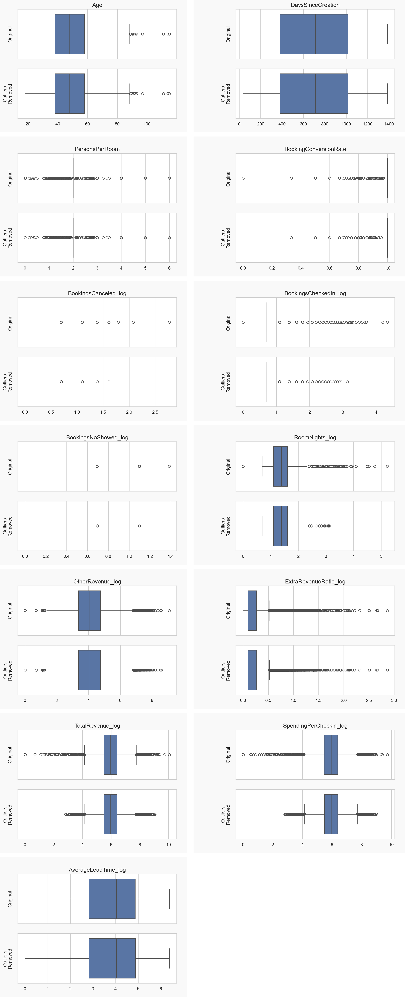

In [25]:
right_perc,right_iqr,left_iqr,left_perc = iqr_or_percentile(X,numerical,3)
df_transformed_wo_outliers = remove_outliers_iqr(X,right_iqr,3)

compare_figure_outliers(X,df_transformed_wo_outliers,numerical)

> Check how many were dropped

In [26]:
(X.shape[0]-df_transformed_wo_outliers.shape[0])/X.shape[0]*100

0.6512596733154917

>  Remove a total from 1.5082% of the data.

In [27]:
'''
# Create a boxplot for all numerical columns
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 15))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop through each numerical feature and create a horizontal boxplot
for i, col in enumerate(numerical):
    sns.boxplot(x=col, data=X, color="darkblue", ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

man_filter = (
    (X['Age']>= 18)
    &
    (X['Age']< 100)
    &
    (X['AverageLeadTime']>= 0)
    &
    (X['AverageLeadTime']<= 500)
    &
    (X['BookingsCheckedIn']<= 30)
    &
    (X['LodgingRevenue']<= 10000)
    &
    (X['OtherRevenue']<= 4000)
    &
    (X['PersonsNights']<= 60)
    &
    (X['RoomNights']<= 50)
)

# percentage lost when removing outliers
print(f"Percentage of data lost when removing outliers is {(X.shape[0] - X[man_filter].shape[0])/X.shape[0] * 100:.2f}%")

X = X[man_filter]
'''

'\n# Create a boxplot for all numerical columns\nfig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20, 15))\n\n# Flatten the axes array for easy iteration\naxes = axes.flatten()\n\n# Loop through each numerical feature and create a horizontal boxplot\nfor i, col in enumerate(numerical):\n    sns.boxplot(x=col, data=X, color="darkblue", ax=axes[i])\n    axes[i].set_title(f\'Boxplot of {col}\')\n\n# Remove any unused subplots\nfor j in range(i + 1, len(axes)):\n    fig.delaxes(axes[j])\n\nplt.tight_layout()\nplt.show()\n\nman_filter = (\n    (X[\'Age\']>= 18)\n    &\n    (X[\'Age\']< 100)\n    &\n    (X[\'AverageLeadTime\']>= 0)\n    &\n    (X[\'AverageLeadTime\']<= 500)\n    &\n    (X[\'BookingsCheckedIn\']<= 30)\n    &\n    (X[\'LodgingRevenue\']<= 10000)\n    &\n    (X[\'OtherRevenue\']<= 4000)\n    &\n    (X[\'PersonsNights\']<= 60)\n    &\n    (X[\'RoomNights\']<= 50)\n)\n\n# percentage lost when removing outliers\nprint(f"Percentage of data lost when removing outliers is {(X.shap

Updating dataframe

In [28]:
X[numerical] = df_transformed_wo_outliers[numerical]

## 4.9 Normalization

### Min-Max Scaler

In [29]:
X_minmax = X[numerical].copy()

# Initialize MinMaxScaler
mm_scaler = MinMaxScaler()

# Apply MinMaxScaler and create a new DataFrame with scaled values
mm_scaled_feat = mm_scaler.fit_transform(X_minmax)

# Replace the original columns with scaled values
X_minmax = pd.DataFrame(mm_scaled_feat, columns=X_minmax.columns, index=X_minmax.index)

# Display the updated DataFrame
X_minmax.head()

,Age,DaysSinceCreation,PersonsPerRoom,BookingConversionRate,BookingsCanceled_log,BookingsCheckedIn_log,BookingsNoShowed_log,RoomNights_log,OtherRevenue_log,ExtraRevenueRatio_log,TotalRevenue_log,SpendingPerCheckin_log,AverageLeadTime_log
ID,,,,,,,,,,,,,
1,0.350515,0.299481,0.250000,0.5,0.430677,0.166015,0.0,0.375168,0.516057,0.086573,0.496932,0.391718,0.641905
2,0.278351,1.000000,0.333333,1.0,0.000000,0.000000,0.0,0.449818,0.465476,0.060441,0.478210,0.484467,0.647046
4,0.443299,1.000000,0.333333,1.0,0.000000,0.000000,0.0,0.449818,0.479699,0.077801,0.461505,0.467655,0.712291
6,0.381443,1.000000,0.333333,1.0,0.000000,0.000000,0.0,0.166015,0.375612,0.034606,0.434872,0.440852,0.639270
8,0.154639,1.000000,0.333333,1.0,0.000000,0.000000,0.0,0.449818,0.531393,0.056435,0.580114,0.587022,0.574368


### Standard Scaler

In [30]:
# Copy the numerical columns
X_standard = X[numerical].copy()

# Initialize StandardScaler
scaler = StandardScaler()

# Apply StandardScaler and create a new DataFrame with scaled values
scaled_features = scaler.fit_transform(X_standard)

# Replace the original columns with scaled values
X_standard = pd.DataFrame(scaled_features, columns=X_standard.columns, index=X_standard.index)

# Display the updated DataFrame
X_standard.head()

,Age,DaysSinceCreation,PersonsPerRoom,BookingConversionRate,BookingsCanceled_log,BookingsCheckedIn_log,BookingsNoShowed_log,RoomNights_log,OtherRevenue_log,ExtraRevenueRatio_log,TotalRevenue_log,SpendingPerCheckin_log,AverageLeadTime_log
ID,,,,,,,,,,,,,
1,0.260932,-0.671672,-0.649384,-19.934389,20.666130,4.203923,-0.024002,0.675083,0.391832,0.213070,-0.024375,-0.960641,0.258425
2,-0.226974,1.841947,0.098224,0.041395,-0.039821,-0.142422,-0.024002,1.124694,-0.005336,-0.203797,-0.186905,-0.157495,0.280271
4,0.888240,1.841947,0.098224,0.041395,-0.039821,-0.142422,-0.024002,1.124694,0.106347,0.073132,-0.331934,-0.303081,0.557541
6,0.470035,1.841947,0.098224,0.041395,-0.039821,-0.142422,-0.024002,-0.584629,-0.710958,-0.615919,-0.563141,-0.535175,0.247227
8,-1.063384,1.841947,0.098224,0.041395,-0.039821,-0.142422,-0.024002,1.124694,0.512255,-0.267693,0.697760,0.730566,-0.028587


### Comparing Scalers

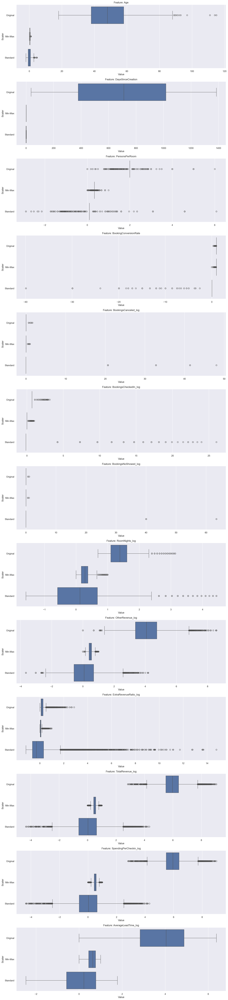

In [31]:
def plot_scaled_features(X, X_minmax, X_standard, numerical):
    # Prepare an empty DataFrame to combine data for plotting
    data_for_plot = pd.DataFrame()

    # Loop over each column in the DataFrames
    for feature in numerical:
        # Combine data from all three DataFrames for the current feature
        df_original = X[[feature]].rename(columns={feature: 'Value'}).reset_index(drop=True)
        df_original['Scaler'] = 'Original'
        df_original['Feature'] = feature

        df_minmax = X_minmax[[feature]].rename(columns={feature: 'Value'}).reset_index(drop=True)
        df_minmax['Scaler'] = 'Min-Max'
        df_minmax['Feature'] = feature

        df_standard = X_standard[[feature]].rename(columns={feature: 'Value'}).reset_index(drop=True)
        df_standard['Scaler'] = 'Standard'
        df_standard['Feature'] = feature

        # Concatenate into the plotting DataFrame
        data_for_plot = pd.concat([data_for_plot, df_original, df_minmax, df_standard], ignore_index=True)

    # Convert the 'Value' column to numeric (to avoid errors with non-numeric data)
    data_for_plot['Value'] = pd.to_numeric(data_for_plot['Value'], errors='coerce')

    # Plotting: Create boxplots for each feature
    num_features = len(numerical)
    rows_per_figure = len(numerical)  # Number of rows (features) to plot per figure

    for start_idx in range(0, num_features, rows_per_figure):
        # Define the range of features to plot in this figure
        end_idx = min(start_idx + rows_per_figure, num_features)
        features_to_plot = numerical[start_idx:end_idx]

        # Filter data for this subset of features
        subset_data = data_for_plot[data_for_plot['Feature'].isin(features_to_plot)]

        # Create the figure
        plt.figure(figsize=(15, 5 * len(features_to_plot)))

        # Loop through each feature and create a subplot
        for idx, feature in enumerate(features_to_plot, 1):
            plt.subplot(len(features_to_plot), 1, idx)
            sns.boxplot(data=subset_data[subset_data['Feature'] == feature], x='Value', y='Scaler', orient='h')
            plt.title(f'Feature: {feature}')

        # Adjust layout and show the plot
        plt.tight_layout()
        plt.show()

plot_scaled_features(X, X_minmax, X_standard, numerical)

### Selecting the best Scaler

In [32]:
final_df = X_standard.copy()

# 5. Exporting Data

In [ ]:
final_df.reset_index(inplace=True)
final_df.to_csv("Case1_HotelCustomerSegmentation_Preprocessed.csv", index=False)